In [1]:
!pip install openslide-python

     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 359.0/359.0 kB 6.9 MB/s eta 0:00:0000:01
  Preparing metadata (setup.py) ... done
  Created wheel for openslide-python: filename=openslide_python-1.3.1-cp310-cp310-linux_x86_64.whl size=27167 sha256=013e579a2ae75b4f42524e21dd7b377f31449155825b888ed34bdf483b343ba4
  Stored in directory: /home/ec2-user/.cache/pip/wheels/79/79/fa/29a0087493c69dff7fd0b70fab5d6771002a531010161d2d97
Successfully built openslide-python


In [2]:
import openslide
import cv2 as cv
import os
import io
import numpy as np
import tensorflow as tf
import csv

from tensorflow.keras.models import load_model
from tqdm import tqdm
from skimage.filters import threshold_otsu
from matplotlib import pyplot as plt
from matplotlib import cm
from matplotlib.gridspec import GridSpec
from PIL import Image

from multiprocessing import Pool
from itertools import product
import time
import threading
# from itertools import compress

2024-03-05 19:16:45.936093: I tensorflow/core/platform/cpu_feature_guard.cc:182] This TensorFlow binary is optimized to use available CPU instructions in performance-critical operations.
To enable the following instructions: AVX2 AVX512F FMA, in other operations, rebuild TensorFlow with the appropriate compiler flags.
2024-03-05 19:17:01.238972: W tensorflow/compiler/tf2tensorrt/utils/py_utils.cc:38] TF-TRT Warning: Could not find TensorRT
/home/ec2-user/anaconda3/envs/tensorflow2_p310/lib/python3.10/site-packages/numpy/core/getlimits.py:549: UserWarning: The value of the smallest subnormal for <class 'numpy.float32'> type is zero.
  setattr(self, word, getattr(machar, word).flat[0])
/home/ec2-user/anaconda3/envs/tensorflow2_p310/lib/python3.10/site-packages/numpy/core/getlimits.py:89: UserWarning: The value of the smallest subnormal for <class 'numpy.float32'> type is zero.
  return self._float_to_str(self.smallest_subnormal)
/home/ec2-user/anaconda3/envs/tensorflow2_p310/lib/python3.

In [3]:
print("TensorFLow - Versão: ",tf.__version__)

# Checar GPUs
if not tf.test.gpu_device_name():
    print('GPU não encontrada.')
else:
    print(f'Dispositivo GPU padrão: {tf.test.gpu_device_name()}')
    print("Número de GPUs Disponíveis: ", len(tf.config.list_physical_devices('GPU')))

TensorFLow - Versão:  2.13.1
GPU não encontrada.


2024-03-05 19:17:33.757947: E tensorflow/compiler/xla/stream_executor/cuda/cuda_driver.cc:268] failed call to cuInit: CUDA_ERROR_NO_DEVICE: no CUDA-capable device is detected


In [5]:
# Carrega a imagem com o OpenSlide
tcga_name = 'TCGA-CD-A489-01Z-00-DX1.AB03DA27-6A86-41C7-9305-E5400E6C47AC'
wsi = openslide.OpenSlide(tcga_name + '.svs')

In [6]:
wsi.level_dimensions

((88535, 56782), (22133, 14195), (5533, 3548), (2766, 1774))

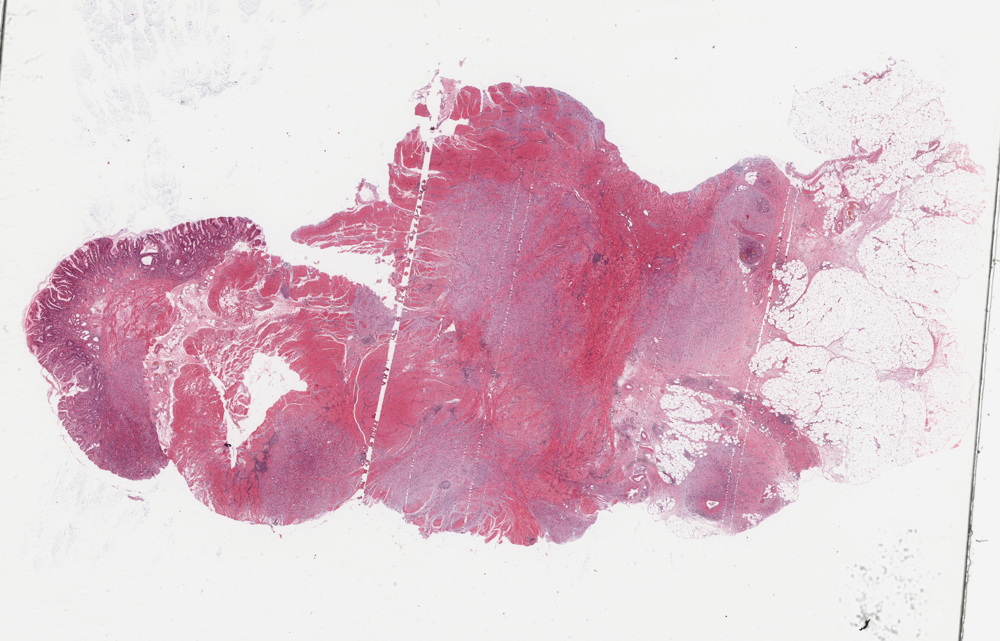

In [7]:
# Pega a menor dimensão disponível na imagem
level = len(wsi.level_dimensions) - 1

# Ler toda a imagem na menor dimensão
img = wsi.read_region((0, 0), level, wsi.level_dimensions[level]).convert('RGB')

# Exibir a imagem
img.show()

del(level, tcga_name)

In [ ]:
# Obtém o tamanho da imagem real
w, h = wsi.dimensions

# Define o tamanho do patch
patch_size = 224

# Torna as dimenções multiplas de 224
width = w + (patch_size - w%patch_size)
hight = h + (patch_size - h%patch_size)

In [ ]:
width, hight

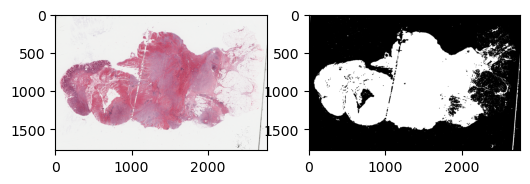

In [10]:
# Converte a imagem para tons de cinza
gray_img = cv.cvtColor(np.array(img), cv.COLOR_RGBA2GRAY)

# Aplica o limiar global
_, thresh = cv.threshold(gray_img, 0, 255, cv.THRESH_BINARY_INV+cv.THRESH_OTSU)

# Aplica uma operação morfológica para remover pequenos objetos e buracos na máscara
kernel = cv.getStructuringElement(cv.MORPH_ELLIPSE, (7, 7))
mask = cv.morphologyEx(thresh, cv.MORPH_CLOSE, kernel)

plt.figure(figsize=(6,10))

plt.subplot(1,2,1)
plt.imshow(img)

plt.subplot(1,2,2)
plt.imshow(mask, cmap='gray')

plt.show()

mask = cv.resize(mask, (width, hight))

del(gray_img, thresh, kernel, w, h, img)

### Quantização

In [11]:
TF_LITE_QA_MODEL_FILE_NAME = 'TCGA-CD-A489_qat_sinete_model_1.tflite'

In [12]:
# Carregar o modelo TFLite
interpreter = tf.lite.Interpreter(model_path=TF_LITE_QA_MODEL_FILE_NAME)
interpreter.allocate_tensors()

# Obter detalhes do modelo
input_details = interpreter.get_input_details()
output_details = interpreter.get_output_details()

# Preparar os dados de entrada
input_shape = input_details[0]['shape']

INFO: Created TensorFlow Lite XNNPACK delegate for CPU.


### Gerando Heatmap

In [13]:
def processing_time(start_time, end_time):
    # Calcular métricas de desempenho
    total_time = end_time - start_time
    minutos, segundos = divmod(total_time, 60)
    milisegundos = int((segundos - int(segundos))*1000)

    print(f'Tempo de execução:\n00:0{int(minutos)}:{int(segundos)}.{milisegundos}')

In [14]:
def _verify_block(y, x):
    # Recortar bloco da máscara
    mask_slide = mask[y:y+slide_dim, x:x+slide_dim]
 
    # Verificar se há componentes de análise
    if np.mean(mask_slide) > 16:
        return y, x

def _process_block(y, x):
    # Retorna uma lista de coordenadas que estão aptas para serem avaliadas
    return [(y + m, x + n) for m, n in product(indices, indices) if np.mean(mask[y + m:y + m+patch_size, x + n:x + n+patch_size]) > 16]

def _process_patch(abs_y, abs_x):

    # Recortar o bloco da imagem
    img_block = wsi.read_region((abs_x, abs_y), 0, (patch_size, patch_size)).convert('RGB')

    # Converter o bloco para o formato numpy
    img_block = np.array(img_block, dtype=np.float32)[:, :, ::-1] # converter RGB para BGR

    # Adicionando uma dimensão extra para criar um batch de tamanho 1
    img_block = np.expand_dims(img_block, axis=0)

    # Definir os dados de entrada no tensor do modelo
    interpreter.set_tensor(input_details[0]['index'], img_block)

    # Executar a predição
    interpreter.invoke()

    # Obter os resultados da predição
    prediction_xy = interpreter.get_tensor(output_details[0]['index'])[0][0]
    y_coord, x_coord = int(abs_y/patch_size), int(abs_x/patch_size)

    if prediction_xy > 0.6:
#         if (y_coord<hight/224-1 or x_coord<width/224-1):
#             result_list.append((y_coord, x_coord, prediction_xy))

        return (y_coord, x_coord, prediction_xy)

In [15]:
# Definir parâmetros
c = 15
slide_dim = patch_size*c
jet_colors = cm.get_cmap("jet")(np.arange(256))[:, :3]
indices = np.arange(0, slide_dim, patch_size)

# Determinar os índices dos blocos na imagem
y_indices = np.arange(0, hight, slide_dim)
x_indices = np.arange(0, width, slide_dim)

# Matriz que irá receber as predições
jet_heatmap_matrix = np.zeros((int(hight/patch_size), int(width/patch_size)), dtype=np.float16)

start_time = time.time()

# Verifica as imagem em blocos em paralelo
with Pool() as pool:
    results = pool.starmap(_verify_block, product(y_indices, x_indices))

results = [item for item in results if item is not None]

# Processar a imagem em blocos em paralelo
with Pool() as pool:
    results = pool.starmap(_process_block, results)

results = [sublista for lista in results for sublista in lista]

with Pool() as pool:
    results = pool.starmap(_process_patch, results)

# Elimina as listas vazias e transforma a lista de listas em uma única lista de tuplas
results = [item for item in results if item is not None]

# Criar uma matriz numpy a partir de results, que é uma lista de tuplas
results_array = np.array(results)

# Extrair as coordenadas y, x e os valores de cada tupla
y = np.int_(results_array[:, 0])
x = np.int_(results_array[:, 1])
valor = results_array[:, 2]

# Usar indexação avançada para atribuir os valores às posições da matriz
jet_heatmap_matrix[y, x] = valor

# for y, x, valor in results:
#     jet_heatmap_matrix[y][x] = valor

end_time = time.time()

# Calcular métricas de desempenho
processing_time(start_time, end_time)

/tmp/ipykernel_15568/3802871979.py:4: MatplotlibDeprecationWarning: The get_cmap function was deprecated in Matplotlib 3.7 and will be removed two minor releases later. Use ``matplotlib.colormaps[name]`` or ``matplotlib.colormaps.get_cmap(obj)`` instead.
  jet_colors = cm.get_cmap("jet")(np.arange(256))[:, :3]
/home/ec2-user/anaconda3/envs/tensorflow2_p310/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/ec2-user/anaconda3/envs/tensorflow2_p310/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/ec2-user/anaconda3/envs/tensorflow2_p310/lib/python3.10/site-packages/numpy/core/fromnumeric.py:3504: RuntimeWarning: Mean of empty slice.
  return _methods._mean(a, axis=axis, dtype=dtype,
/home/ec2-user/anaconda3/envs/tensorflow2_p310/lib/python3.10/site-packages/numpy/core/fromnumeric.p

Tempo de execução:
00:00:15.218


In [16]:
heatmap_matrix = np.uint8(255 * jet_heatmap_matrix)

jet_heatmap = jet_colors[heatmap_matrix]

jet_heatmap = tf.keras.utils.array_to_img(jet_heatmap)

# Salvar a imagem como JPEG
jet_heatmap.save(f'hm_TCGA-CD-A489_qat.jpg', quality=100)  # Ajuste o valor de qualidade (0-100) conforme necessário

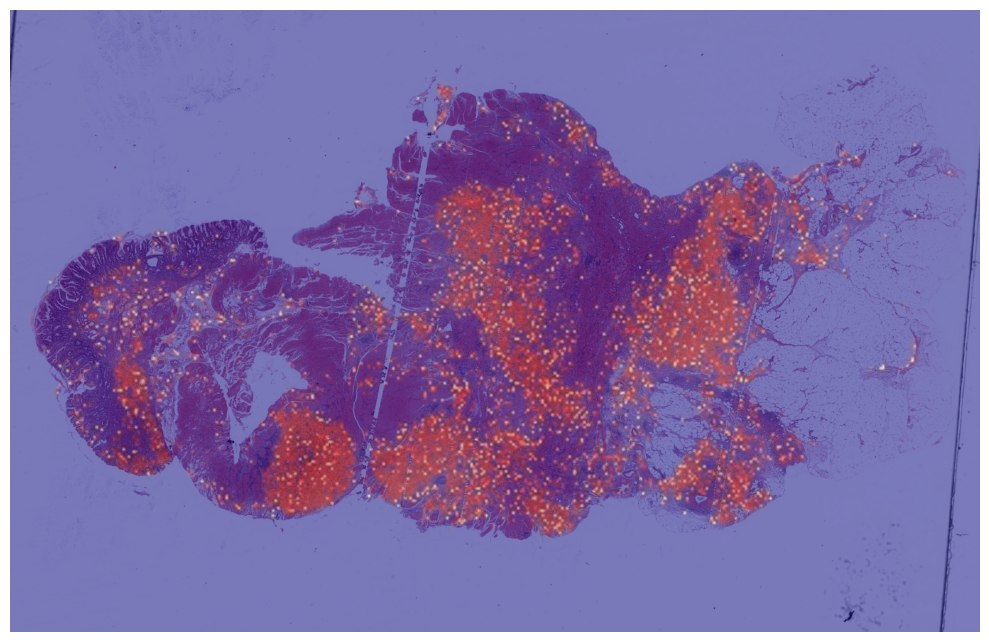

In [17]:
# Ler toda a imagem na menor dimensão
img = wsi.read_region((0, 0), 3, wsi.level_dimensions[3]).convert('RGB')

img_array = np.array(img, dtype=np.float32)#[:, :, ::-1]
jet_heatmap = Image.open('hm_TCGA-CD-A489_qat.jpg')
jet_heatmap = jet_heatmap.resize((img_array.shape[1], img_array.shape[0]))

superimposed_img = np.array(jet_heatmap)*1 + img_array 
superimposed_img = tf.keras.utils.array_to_img(superimposed_img)
superimposed_img.save(f'superimposed_TCGA-CD-A489_qat.jpg', quality=100)  # Ajuste o valor de qualidade (0-100) conforme necessário
# Plotando figuras
plt.figure(figsize=(10,12))
plt.imshow(superimposed_img)
plt.axis('off')

# Ajuste de layout
plt.tight_layout()

plt.show()